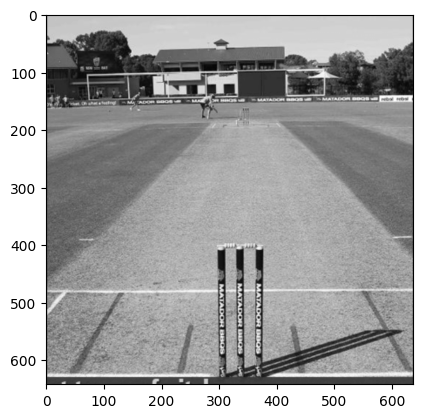

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Reading color image
img = cv2.imread("/content/drive/MyDrive/print this pics/Screenshot 2023-12-04 at 12.53.36 PM.png")

# Check if the image has been correctly loaded
if img is None:
    print("Could not open or find the image.")
else:
    # Converting color image to grayscale image
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Display the grayscale image using matplotlib to correct the color map
    plt.imshow(gray, cmap='gray')
    plt.show()


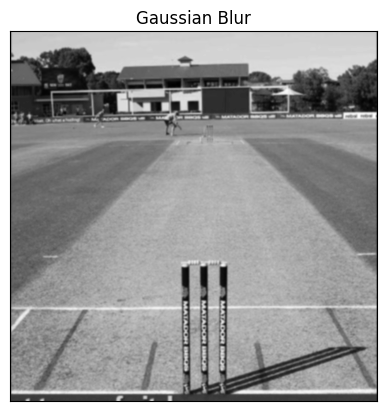

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Assuming 'gray' is your previously converted grayscale image
blur = cv2.GaussianBlur(gray, (5, 5), 0)

# Display the blurred image using matplotlib
plt.imshow(blur, cmap='gray')
plt.title('Gaussian Blur')
plt.xticks([]) # Removes x-axis ticks
plt.yticks([]) # Removes y-axis ticks
plt.show()


In [ ]:
import cv2
import numpy as np

# Load the image
image = cv2.imread('/content/drive/MyDrive/print this pics/Screenshot 2023-12-04 at 12.53.36 PM.png')

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply thresholding to get the pitch area
_, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)

# Find contours
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Assume the largest contour is the pitch
pitch_contour = max(contours, key=cv2.contourArea)

# Draw the contour on the image
cv2.drawContours(image, [pitch_contour], -1, (0, 255, 0), 3)

# Save or display the image
cv2.imwrite('detected_pitch.png', image)



True

In [ ]:
pip install opencv-python-headless matplotlib


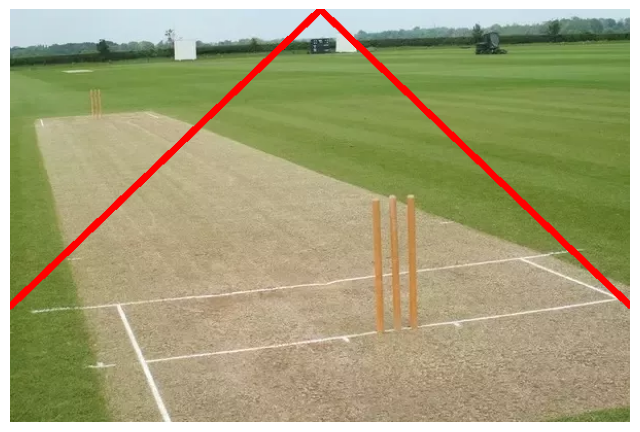

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Read the image from the in-memory location directly
image = cv2.imread('/content/drive/MyDrive/print this pics/i3.webp')

# Check if the image is read correctly
if image is not None:
    # Convert the image to RGB
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Define the endpoints of the lines to draw based on the example provided
    # The coordinates are chosen based on the relative position in the image
    height, width = image_rgb.shape[:2]
    top_center = (width // 2, 0)  # Approximate middle of the top edge
    bottom_left = (0, int(height * 0.72))  # Bottom left based on the pitch's visual position
    bottom_right = (width, int(height * 0.72))  # Bottom right based on the pitch's visual position

    # Draw the red lines on the pitch
    line_color = (255, 0, 0)  # Red color in RGB
    line_thickness = 5
    cv2.line(image_rgb, top_center, bottom_left, line_color, line_thickness)
    cv2.line(image_rgb, top_center, bottom_right, line_color, line_thickness)

    # Display the image with lines using Matplotlib
    plt.figure(figsize=(8, 8))
    plt.imshow(image_rgb)
    plt.axis('off')  # Hide the axis
    plt.show()
else:
    print("The image could not be loaded.")


In [ ]:
import cv2
import matplotlib.pyplot as plt

def draw_lines_on_pitch(image_path):
    # Read the image
    image = cv2.imread(image_path)

    # Check if the image is read correctly
    if image is not None:
        # Convert the image to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Get the dimensions of the image
        height, width = image_rgb.shape[:2]

        # Define the relative positions for the lines
        # These are ratios that you can adjust based on the typical position of the pitch in your images
        top_center_ratio = 0.5  # The top line will be at half the width of the image
        bottom_height_ratio = 0.72  # The bottom of the lines will be at 72% of the height of the image

        # Calculate the actual coordinates
        top_center = (int(width * top_center_ratio), 0)
        bottom_left = (0, int(height * bottom_height_ratio))
        bottom_right = (width, int(height * bottom_height_ratio))

        # Draw the red lines on the pitch
        line_color = (255, 0, 0)  # Red color in RGB
        line_thickness = 5
        cv2.line(image_rgb, top_center, bottom_left, line_color, line_thickness)
        cv2.line(image_rgb, top_center, bottom_right, line_color, line_thickness)

        # Display the image with lines using Matplotlib
        plt.figure(figsize=(8, 8))
        plt.imshow(image_rgb)
        plt.axis('off')  # Hide the axis
        plt.show()
    else:
        print("The image could not be loaded.")

# Example usage
draw_lines_on_pitch('/path/to/your/image.jpg')


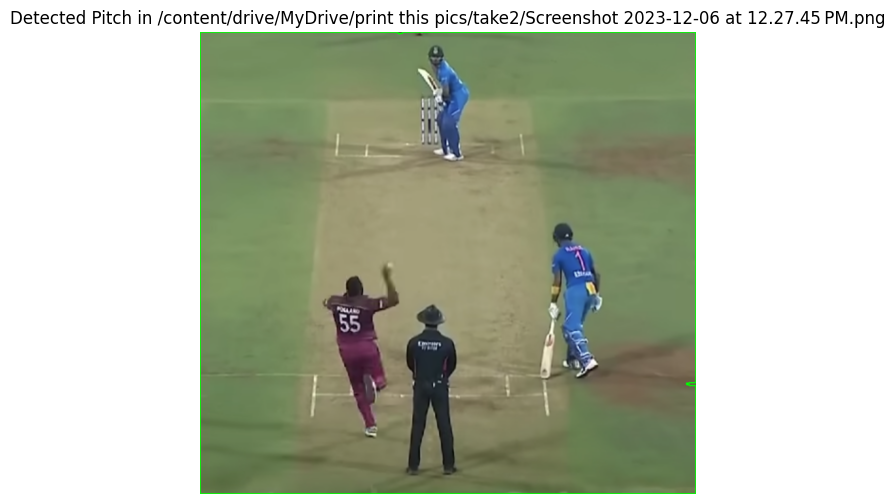

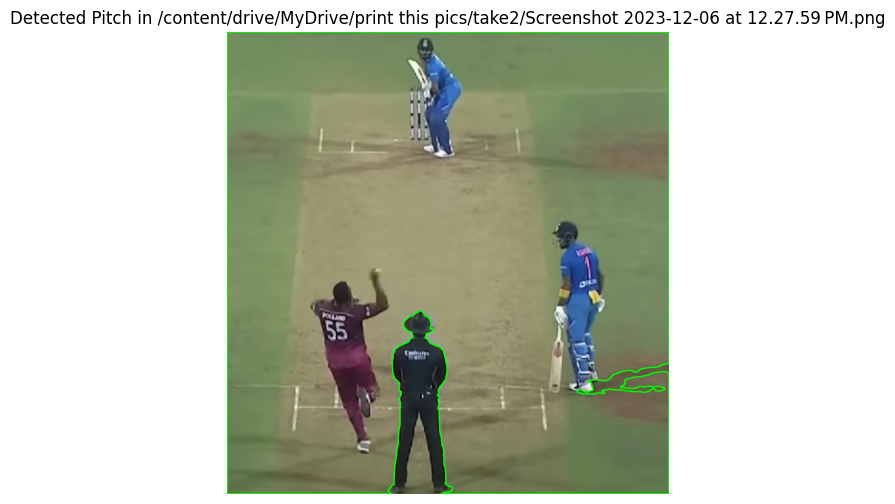

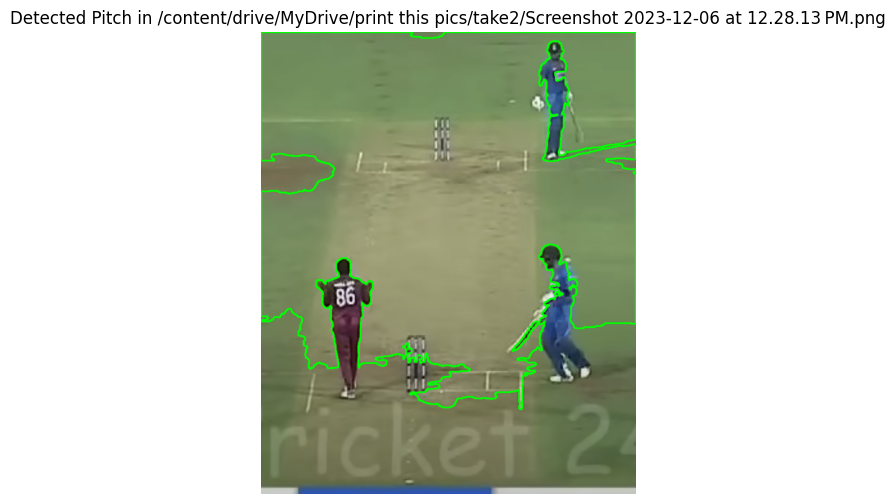

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def detect_and_display_pitch(image_path):
    # Read the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image at {image_path} could not be loaded.")
        return

    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur
    blur = cv2.GaussianBlur(gray, (5, 5), 0)

    # Threshold the image
    _, thresh = cv2.threshold(blur, 200, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Find contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

    # Sort the contours by area and take the largest one, assuming that's the pitch
    if contours:
        pitch_contour = max(contours, key=cv2.contourArea)
        # Draw contours
        cv2.drawContours(image, [pitch_contour], -1, (0, 255, 0), 2)

    # Convert to RGB for displaying
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display the image with detected pitch
    plt.figure(figsize=(10, 6))
    plt.imshow(image_rgb)
    plt.title(f"Detected Pitch in {image_path}")
    plt.axis('off')  # Hide the axis
    plt.show()

# Use the function on the uploaded images
image_paths = [
    '/content/drive/MyDrive/print this pics/take2/Screenshot 2023-12-06 at 12.27.45 PM.png',
    '/content/drive/MyDrive/print this pics/take2/Screenshot 2023-12-06 at 12.27.59 PM.png',
    '/content/drive/MyDrive/print this pics/take2/Screenshot 2023-12-06 at 12.28.13 PM.png',]

for img_path in image_paths:
    detect_and_display_pitch(img_path)


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def detect_and_display_cricket_pitch(image_path, threshold_distance=100):
    # Read the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image at {image_path} could not be loaded.")
        return

    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur
    blur = cv2.GaussianBlur(gray, (5, 5), 0)

    # Threshold the image
    _, thresh = cv2.threshold(blur, 200, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Find contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

    # Center of the image
    height, width = image.shape[:2]
    image_center = (width // 2, height // 2)

    # Function to calculate distance of a contour's centroid from the image center
    def distance_from_center(contour):
        M = cv2.moments(contour)
        if M['m00'] != 0:
            cx = int(M['m10'] / M['m00'])
            cy = int(M['m01'] / M['m00'])
            distance = np.sqrt((cx - image_center[0])**2 + (cy - image_center[1])**2)
            return distance
        else:
            return float('inf')

    # Filter contours based on proximity to center
    central_contours = [contour for contour in contours if distance_from_center(contour) < threshold_distance]

    # Draw contours
    if central_contours:
        for contour in central_contours:
            cv2.drawContours(image, [contour], -1, (0, 255, 0), 2)

    # Convert to RGB for displaying
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display the image with detected pitch
    plt.figure(figsize=(10, 6))
    plt.imshow(image_rgb)
    plt.title(f"Detected Cricket Pitch in {image_path}")
    plt.axis('off')
    plt.show()

# Example usage
detect_and_display_cricket_pitch('/content/drive/MyDrive/print this pics/Screenshot 2023-12-04 at 12.53.36 PM.png', threshold_distance=100)


Image at /content/drive/MyDrive/print this pics/take2 could not be loaded.


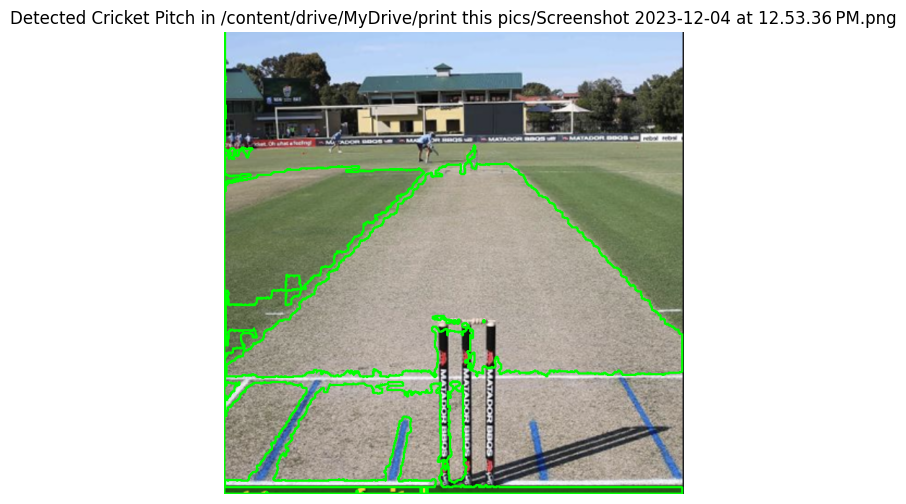

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def detect_and_display_cricket_pitch(image_path, threshold_distance=100):
    # Read the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image at {image_path} could not be loaded.")
        return

    # Convert to HSV color space
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define color ranges for different pitches
    green_lower = np.array([40, 40, 40])
    green_upper = np.array([80, 255, 255])
    brown_lower = np.array([0, 20, 20])
    brown_upper = np.array([30, 255, 255])

    # Create masks for different pitch colors
    green_mask = cv2.inRange(hsv, green_lower, green_upper)
    brown_mask = cv2.inRange(hsv, brown_lower, brown_upper)

    # Combine masks
    combined_mask = cv2.bitwise_or(green_mask, brown_mask)

    # Apply morphological operations
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, (5, 5))
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, (20, 20))

    # Find contours
    contours, _ = cv2.findContours(combined_mask, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

    # Center of the image
    height, width = image.shape[:2]
    image_center = (width // 2, height // 2)

    # Function to calculate distance of a contour's centroid from the image center
    def distance_from_center(contour):
        M = cv2.moments(contour)
        if M['m00'] != 0:
            cx = int(M['m10'] / M['m00'])
            cy = int(M['m01'] / M['m00'])
            distance = np.sqrt((cx - image_center[0])**2 + (cy - image_center[1])**2)
            return distance
        else:
            return float('inf')

    # Filter contours based on proximity to center
    central_contours = [contour for contour in contours if distance_from_center(contour) < threshold_distance]

    # Draw contours
    if central_contours:
        for contour in central_contours:
            cv2.drawContours(image, [contour], -1, (0, 255, 0), 2)

    # Convert to RGB for displaying
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display the image with detected pitch
    plt.figure(figsize=(10, 6))
    plt.imshow(image_rgb)
    plt.title(f"Detected Cricket Pitch in {image_path}")
    plt.axis('off')
    plt.show()

# Example usage
detect_and_display_cricket_pitch('/content/drive/MyDrive/print this pics/Screenshot 2023-12-04 at 12.53.36 PM.png', threshold_distance=100)

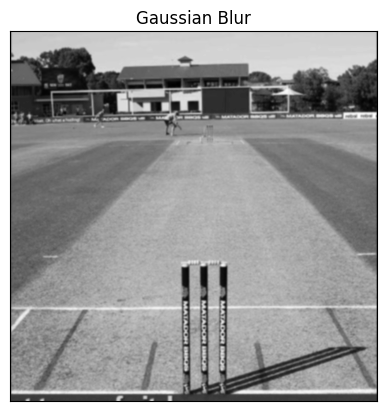

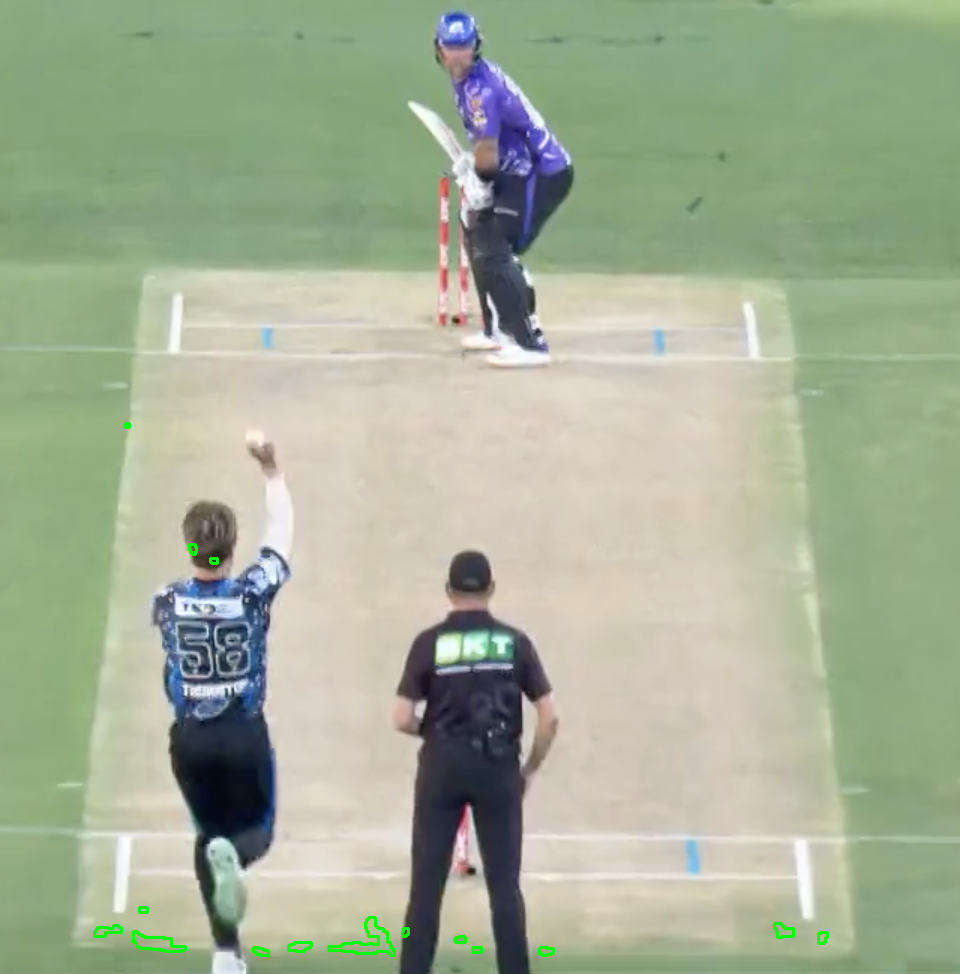

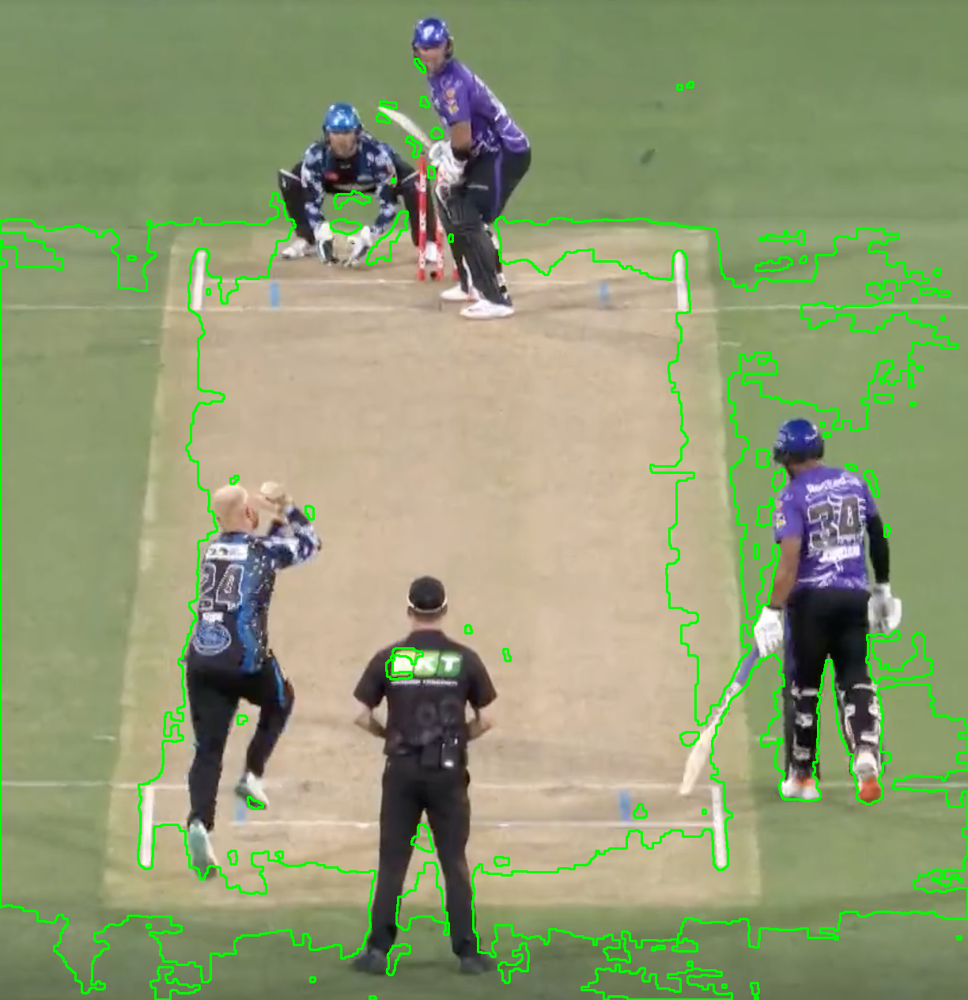

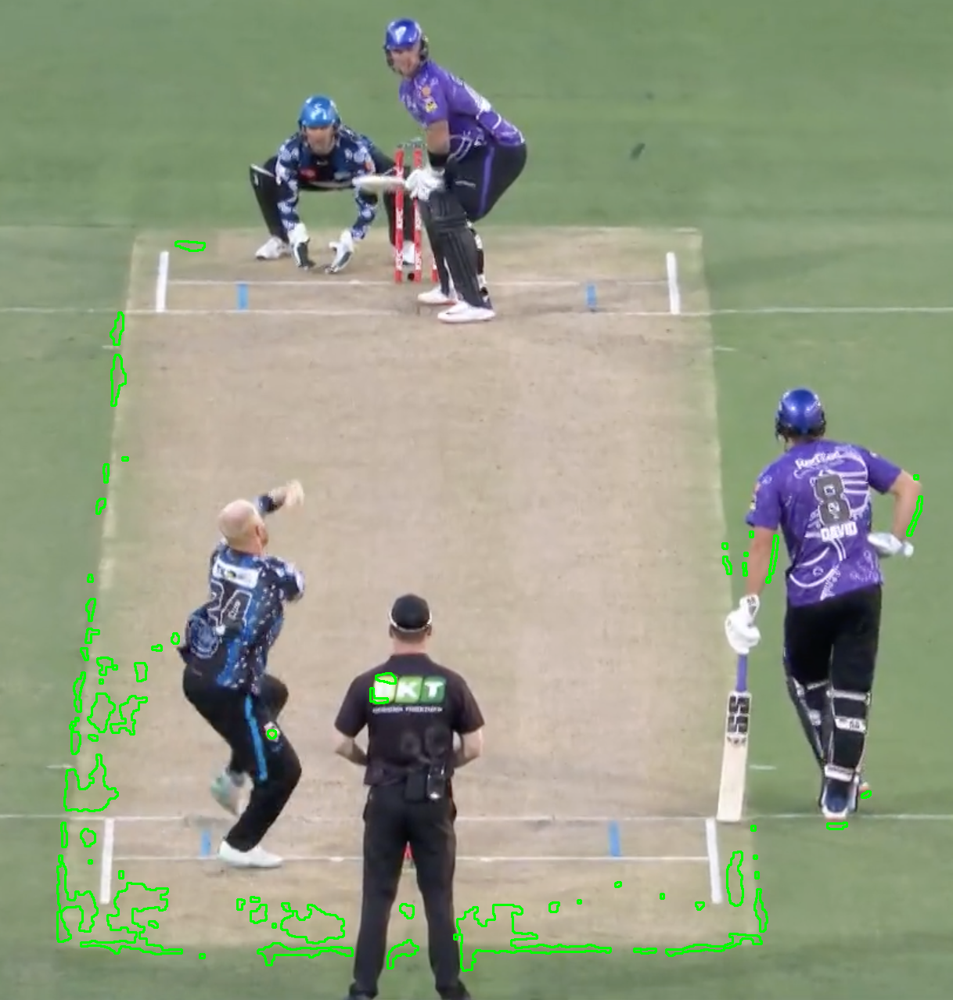

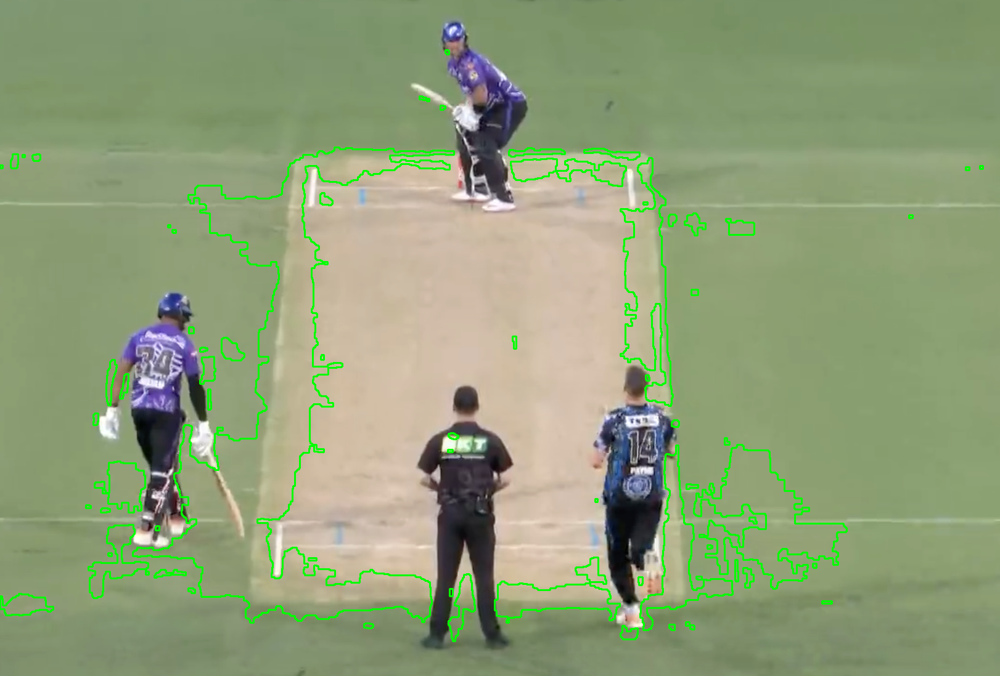

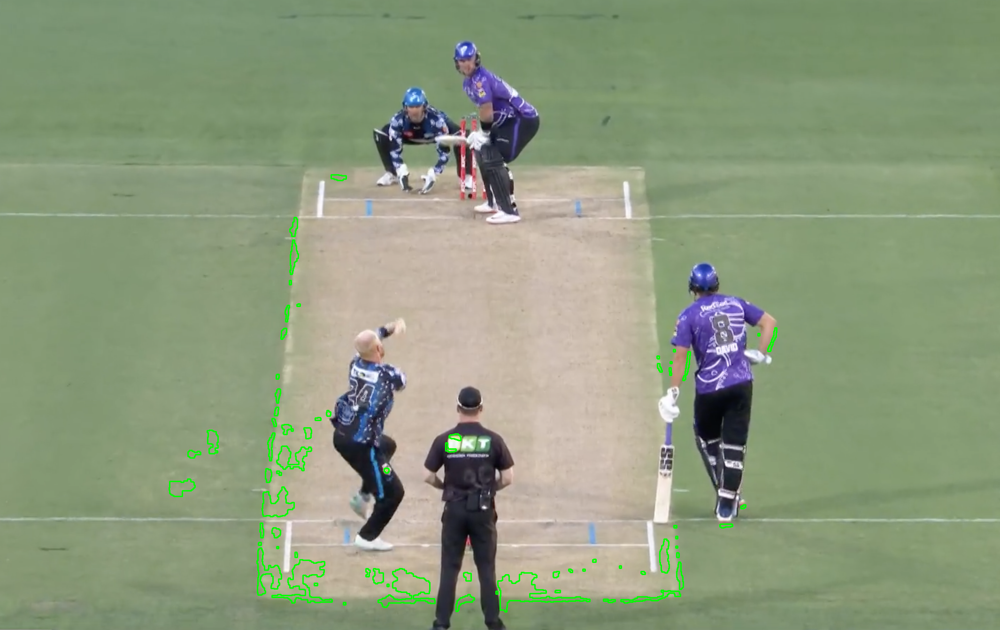

In [ ]:
import cv2
import numpy as np
import os
from google.colab.patches import cv2_imshow


def detect_pitch(image_path):
    # Read the image
    img = cv2.imread(image_path)

    # Convert the image to HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Define the color range for the pitch (you may need to adjust these values)
    lower_pitch = np.array([20, 50, 50])
    upper_pitch = np.array([40, 255, 255])

    # Create a binary mask for the pitch
    pitch_mask = cv2.inRange(hsv, lower_pitch, upper_pitch)

    # Apply morphological operations to clean up the mask
    kernel = np.ones((5, 5), np.uint8)
    pitch_mask = cv2.morphologyEx(pitch_mask, cv2.MORPH_OPEN, kernel)
    pitch_mask = cv2.morphologyEx(pitch_mask, cv2.MORPH_CLOSE, kernel)

    # Find contours in the mask
    contours, _ = cv2.findContours(pitch_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Draw the contours on the original image
    result = img.copy()
    cv2.drawContours(result, contours, -1, (0, 255, 0), 2)

    # Display the result
    cv2_imshow(result)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Replace 'your_dataset_folder' with the path to your dataset folder
dataset_folder = '/content/drive/MyDrive/print this pics'

# Process each image in the dataset folder
for filename in os.listdir(dataset_folder):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        image_path = os.path.join(dataset_folder, filename)
        detect_pitch(image_path)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


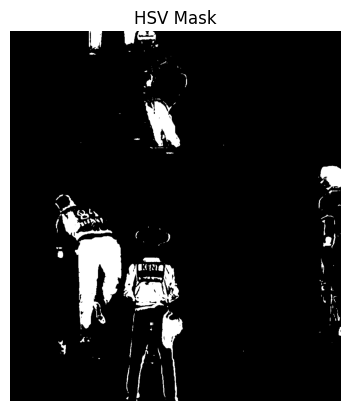

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Correct the file path and name
directory_path = "/content/drive/MyDrive/print this pics/take2/"
fileName = "Screenshot 2023-12-12 at 2.23.00 PM.png"  # Ensure this is the correct file name

# Combine directory path and file name
full_path = directory_path + fileName

# Reading an image in default mode
inputImage = cv2.imread(full_path)

# Check if the image was loaded successfully
if inputImage is None:
    print(f"Could not load image at path: {full_path}")
else:
    # Deep copy for results
    inputImageCopy = inputImage.copy()

    # Convert the image to the HSV color space
    hsvImage = cv2.cvtColor(inputImage, cv2.COLOR_BGR2HSV)

    # Set the HSV values
    lowRange = np.array([0, 120, 0])
    uppRange = np.array([179, 255, 255])

    # Create the HSV mask
    binaryMask = cv2.inRange(hsvImage, lowRange, uppRange)

    # Display the HSV mask
    plt.imshow(binaryMask, cmap='gray')
    plt.title('HSV Mask')
    plt.axis('off')
    plt.show()


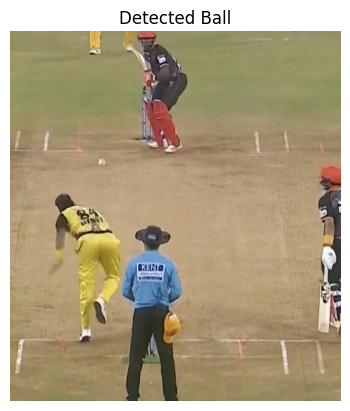

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = '/content/drive/MyDrive/print this pics/take2/Screenshot 2023-12-12 at 2.23.00 PM.png'
image = cv2.imread(image_path)

# Convert to the HSV color space
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Define the color range for detecting the ball
# These values need to be adjusted for the ball's color
lower_color = np.array([30, 150, 50])
upper_color = np.array([50, 255, 180])

# Create a mask for the color
mask = cv2.inRange(hsv, lower_color, upper_color)

# Find contours in the mask
contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Assuming the largest contour is the ball
if contours:
    max_contour = max(contours, key=cv2.contourArea)
    ((x, y), radius) = cv2.minEnclosingCircle(max_contour)
    cv2.circle(image, (int(x), int(y)), int(radius), (0, 255, 0), 2)

# Convert BGR to RGB for displaying in matplotlib
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the result using matplotlib
plt.imshow(image_rgb)
plt.title('Detected Ball')
plt.axis('off') # Hide the axis
plt.show()


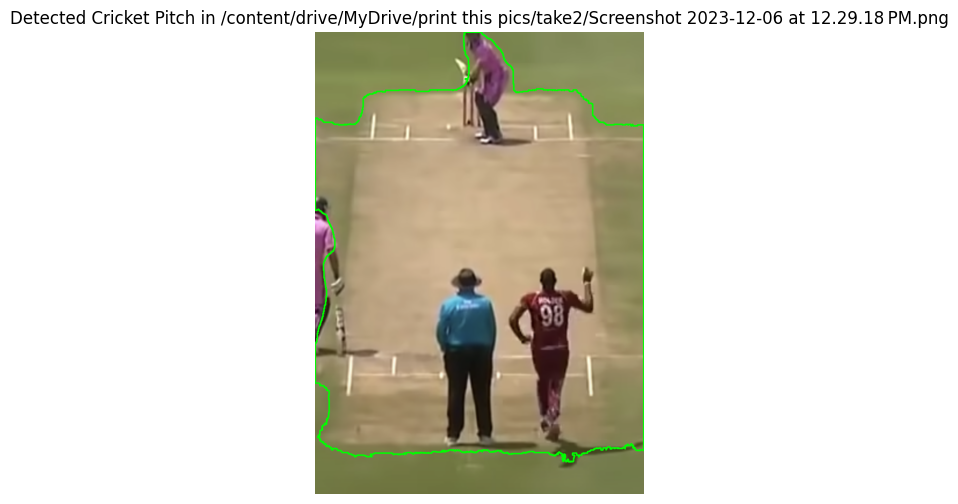

NameError: ignored

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def detect_and_display_cricket_pitch(image_path, threshold_distance=100):
    # Read the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image at {image_path} could not be loaded.")
        return

    # Convert to HSV color space
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define color ranges for different pitches
    green_lower = np.array([40, 40, 40])
    green_upper = np.array([80, 255, 255])
    brown_lower = np.array([0, 20, 20])
    brown_upper = np.array([30, 255, 255])

    # Create masks for different pitch colors
    green_mask = cv2.inRange(hsv, green_lower, green_upper)
    brown_mask = cv2.inRange(hsv, brown_lower, brown_upper)

    # Combine masks
    combined_mask = cv2.bitwise_or(green_mask, brown_mask)

    # Apply morphological operations
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, (5, 5))
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, (20, 20))

    # Find contours
    contours, _ = cv2.findContours(combined_mask, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

    # Center of the image
    height, width = image.shape[:2]
    image_center = (width // 2, height // 2)

    import cv2
import numpy as np
import matplotlib.pyplot as plt

def detect_and_display_cricket_pitch(image_path, threshold_distance=100):
    # Read the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image at {image_path} could not be loaded.")
        return

    # Convert to HSV color space
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define color ranges for different pitches
    green_lower = np.array([40, 40, 40])
    green_upper = np.array([80, 255, 255])
    brown_lower = np.array([0, 20, 20])
    brown_upper = np.array([30, 255, 255])

    # Create masks for different pitch colors
    green_mask = cv2.inRange(hsv, green_lower, green_upper)
    brown_mask = cv2.inRange(hsv, brown_lower, brown_upper)

    # Combine masks
    combined_mask = cv2.bitwise_or(green_mask, brown_mask)

    # Apply morphological operations
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, (5, 5))
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, (20, 20))

    # Find contours
    contours, _ = cv2.findContours(combined_mask, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

    # Center of the image
    height, width = image.shape[:2]
    image_center = (width // 2, height // 2)

    # Function to calculate distance of a contour's centroid from the image center
    def distance_from_center(contour):
        M = cv2.moments(contour)
        if M['m00'] != 0:
            cx = int(M['m10'] / M['m00'])
            cy = int(M['m01'] / M['m00'])
            distance = np.sqrt((cx - image_center[0])**2 + (cy - image_center[1])**2)
            return distance
        else:
            return float('inf')

    # Filter contours based on proximity to center
    central_contours = [contour for contour in contours if distance_from_center(contour) < threshold_distance]

    # Draw contours
    if central_contours:
        for contour in central_contours:
            cv2.drawContours(image, [contour], -1, (0, 255, 0), 2)

    # Convert to RGB for displaying
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display the image with detected pitch
    plt.figure(figsize=(10, 6))
    plt.imshow(image_rgb)
    plt.title(f"Detected Cricket Pitch in {image_path}")
    plt.axis('off')
    plt.show()

# Example usage
detect_and_display_cricket_pitch('/content/drive/MyDrive/print this pics/take2/Screenshot 2023-12-06 at 12.29.18 PM.png', threshold_distance=100)
 # Filter contours based on proximity to center
central_contours = [contour for contour in contours if distance_from_center(contour) < threshold_distance]

    # Draw contours
if central_contours:
    for contour in central_contours:
         cv2.drawContours(image, [contour], -1, (0, 255, 0), 2)

    # Convert to RGB for displaying
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display the image with detected pitch
    plt.figure(figsize=(10, 6))
    plt.imshow(image_rgb)
    plt.title(f"Detected Cricket Pitch in {image_path}")
    plt.axis('off')
    plt.show()

# Example usage
detect_and_display_cricket_pitch('/content/drive/MyDrive/print this pics/take2/Screenshot 2023-12-06 at 12.29.18 PM.png', threshold_distance=100)

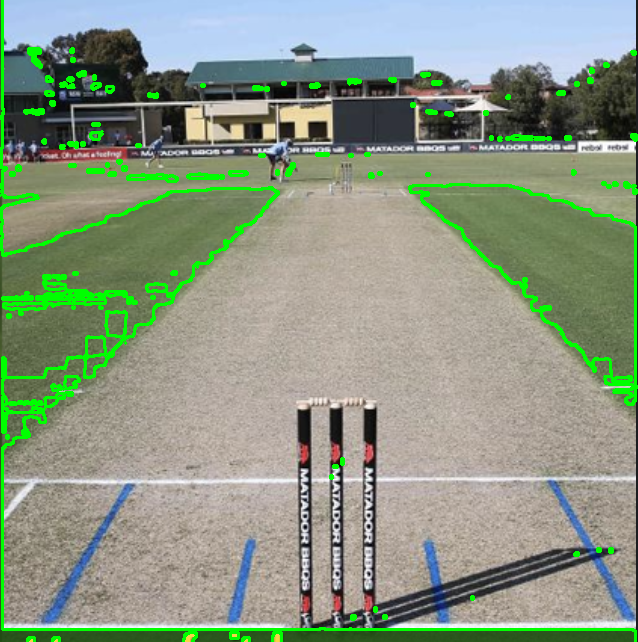

In [ ]:
import cv2
import numpy as np

from google.colab.patches import cv2_imshow

def detect_cricket_pitch(image_path):
    # Read the image
    image = cv2.imread(image_path)

    # Convert to HSV
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define Color Range for Pitch (Greenish to Brownish)
    lower_pitch = np.array([40, 40, 40])
    upper_pitch = np.array([80, 255, 255])

    # Create a Mask for Pitch Color
    pitch_mask = cv2.inRange(hsv_image, lower_pitch, upper_pitch)

    # Apply GaussianBlur to reduce noise
    blurred_pitch_mask = cv2.GaussianBlur(pitch_mask, (5, 5), 0)

    # Apply Edge Detection
    edges = cv2.Canny(blurred_pitch_mask, 50, 150)

    # Find Contours
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Draw Contours on Original Image
    cv2.drawContours(image, contours, -1, (0, 255, 0), 2)

    # Display the Result using cv2_imshow
    cv2_imshow(image)

# Example usage
detect_cricket_pitch('/content/drive/MyDrive/print this pics/danger/Screenshot 2023-12-04 at 12.53.36 PM.png')


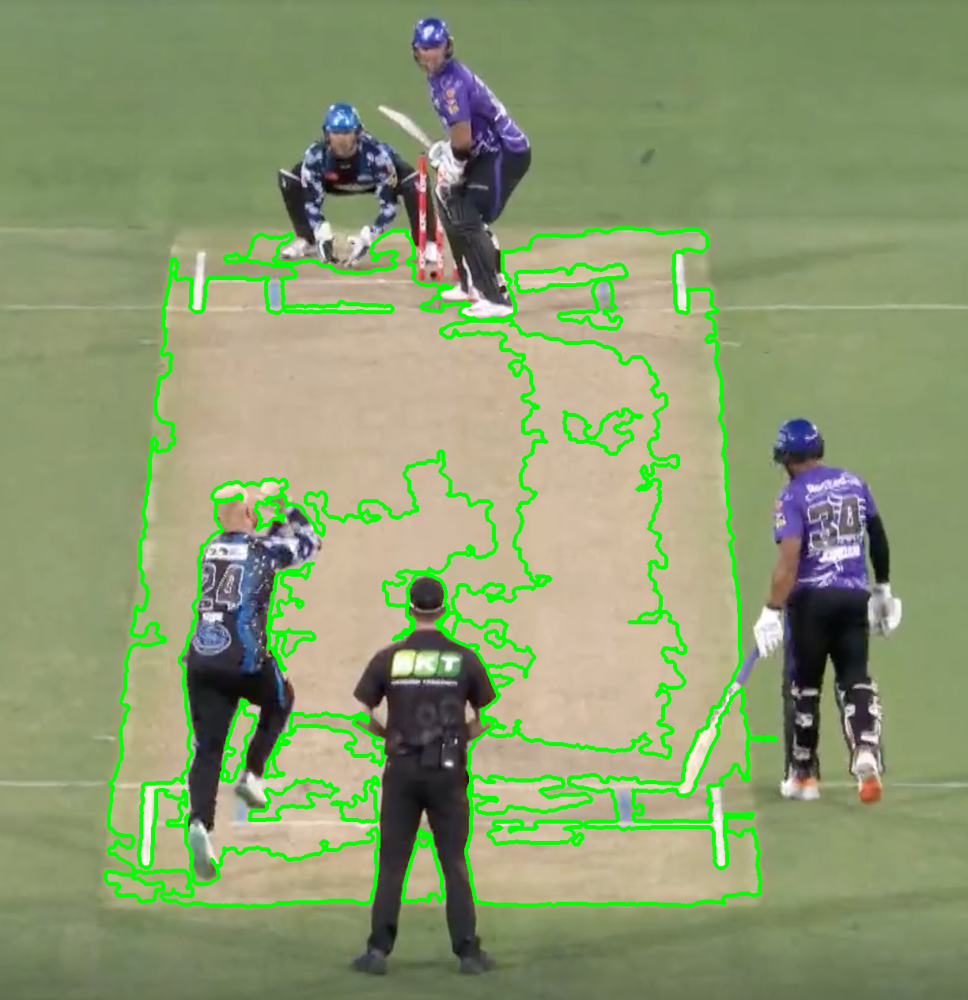

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def detect_pitch(image_path):
    # Load the image
    image = cv2.imread(image_path)

    # Convert the image to the HSV color space
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define the center region of the image to sample the pitch color
    center_region = hsv_image[hsv_image.shape[0]//4:3*hsv_image.shape[0]//4, hsv_image.shape[1]//4:3*hsv_image.shape[1]//4]

    # Calculate the average color of the center region
    average_color = np.mean(center_region.reshape(-1, 3), axis=0)

    # Define a range around the average color for pitch detection
    # The range values here are placeholders; you'll need to determine appropriate values through experimentation
    sensitivity = 15
    lower_color = np.maximum(average_color - sensitivity, 0)
    upper_color = np.minimum(average_color + sensitivity, 255)

    # Create a mask using the color range
    mask = cv2.inRange(hsv_image, lower_color.astype(np.uint8), upper_color.astype(np.uint8))

    # Apply morphological operations to clean up the mask
    kernel = np.ones((5,5),np.uint8)
    mask_cleaned = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    # Find contours from the mask
    contours, hierarchy = cv2.findContours(mask_cleaned, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Filter contours based on size and shape
     # ...

    # Define a threshold for the minimum contour area
    some_threshold = 1000  # Example threshold, you'll need to adjust this based on your image

    # Filter contours based on size and shape
    pitch_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > some_threshold]

    # ...

    # Draw contours on the image
    cv2.drawContours(image, pitch_contours, -1, (0, 255, 0), 3)

    # Display the result
    cv2_imshow(image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

    return image, mask_cleaned

# Usage
detected_image, pitch_mask = detect_pitch('/content/drive/MyDrive/print this pics/Screenshot 2024-01-10 at 1.48.02 PM.png')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


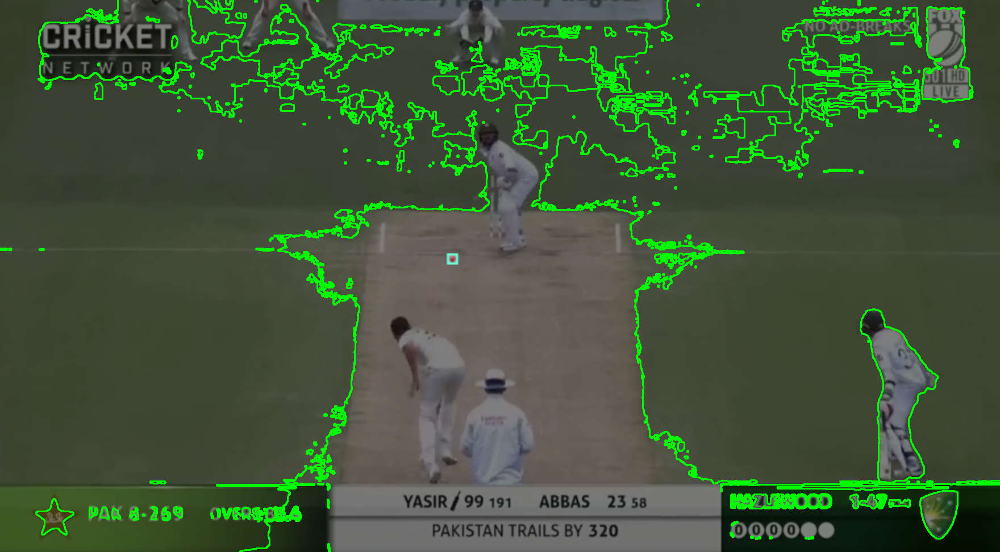

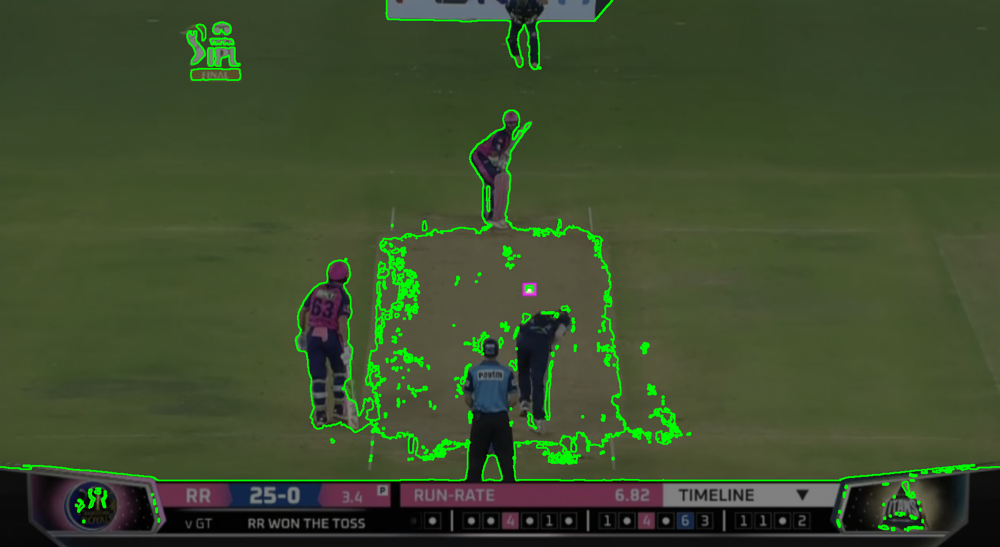

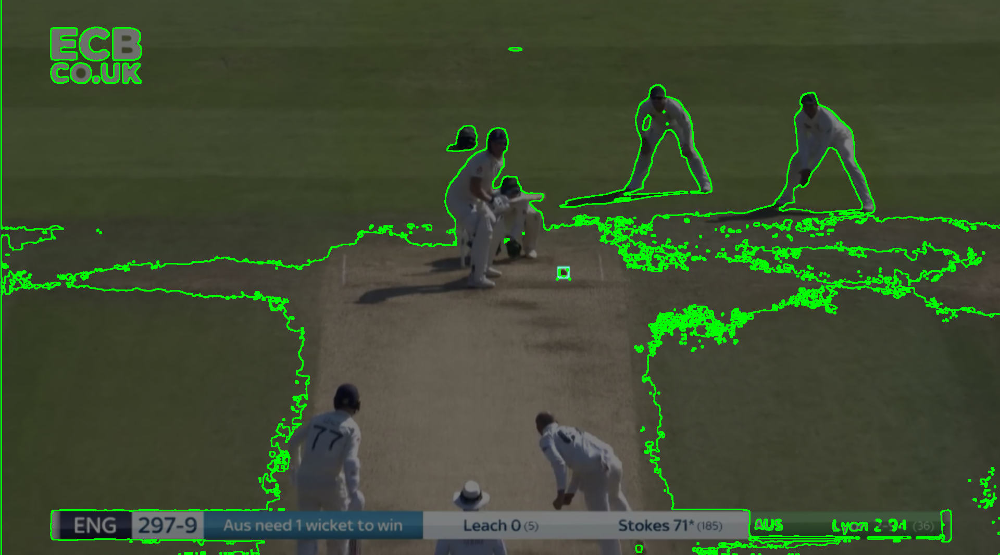

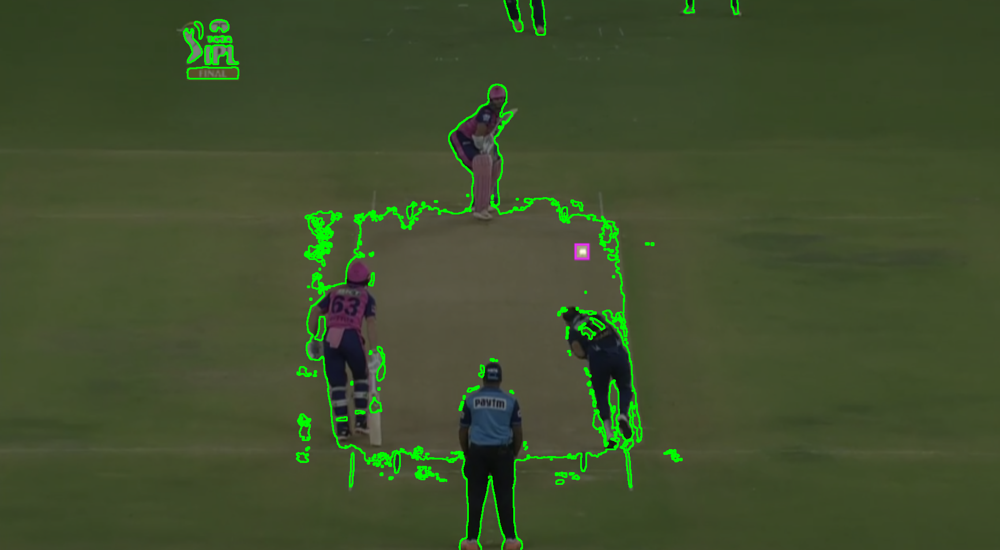

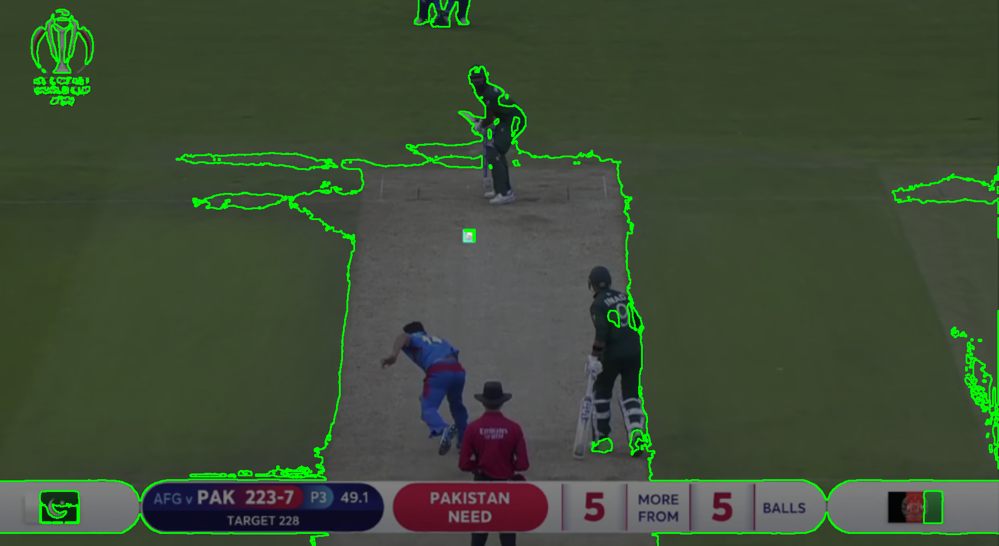

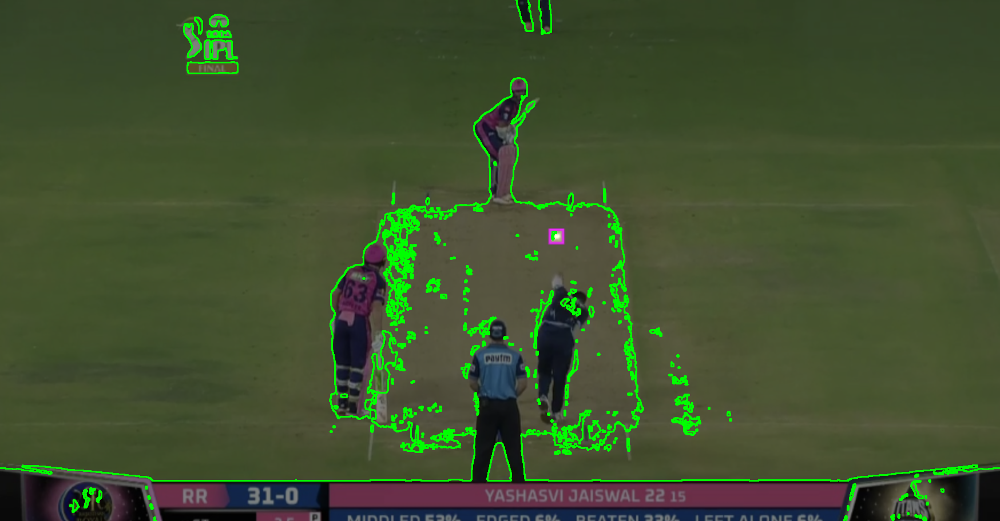

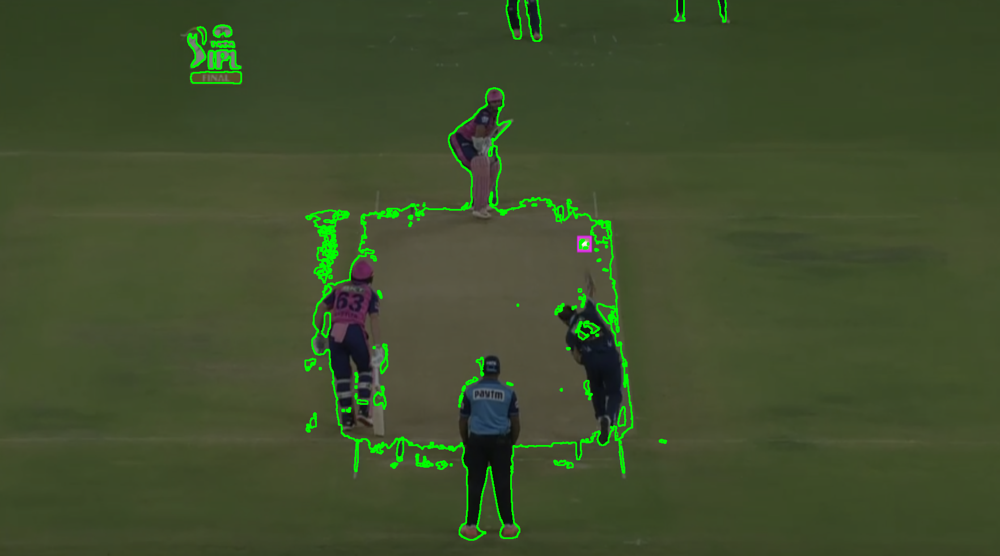

In [ ]:
import cv2
import numpy as np
import os
from google.colab.patches import cv2_imshow
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

def nearest_color(subject, color_list):
    # Find the nearest color range
    return min(color_list, key=lambda x: sum((s - c) ** 2 for s, c in zip(subject, x[0])))

def process_image(image_path):
    # Read the image
    image = cv2.imread(image_path)

    # Convert to HSV
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define the center block coordinates (e.g., central 10% of the image)
    h, w = hsv_image.shape[:2]
    cx, cy = w // 2, h // 2
    block_size = 0.1  # 10% of the image size
    x_start, x_end = int(cx - w * block_size / 2), int(cx + w * block_size / 2)
    y_start, y_end = int(cy - h * block_size / 2), int(cy + h * block_size / 2)

    # Extract the center block and calculate its average color
    center_block = hsv_image[y_start:y_end, x_start:x_end]
    average_color = np.mean(center_block, axis=(0, 1))

    # Define multiple Color Ranges for different shades of Pitches
    pitch_color_ranges = [
        (np.array([40, 40, 40]), np.array([80, 255, 255])),  # Standard
        (np.array([30, 50, 50]), np.array([70, 255, 255])),  # Shade1
        (np.array([25, 40, 40]), np.array([85, 255, 255]))   # Shade2
    ]

    # Find the nearest color range
    lower_pitch, upper_pitch = nearest_color(average_color, pitch_color_ranges)

    # Create a Mask for the Detected Pitch Color
    pitch_mask = cv2.inRange(hsv_image, lower_pitch, upper_pitch)

    # Apply GaussianBlur to reduce noise (optional, based on your needs)
    blurred_pitch_mask = cv2.GaussianBlur(pitch_mask, (5, 5), 0)

    # Apply Edge Detection
    edges = cv2.Canny(blurred_pitch_mask, 50, 150)

    # Find Contours
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Example for visualization
    cv2.drawContours(image, contours, -1, (0, 255, 0), 2)
    cv2_imshow(image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

def detect_cricket_pitch(folder_path):
    # Check if folder path exists
    if not os.path.exists(folder_path):
        print("Folder not found")
        return

    # Loop through each file in the folder
    for filename in os.listdir(folder_path):
        # Construct full file path
        file_path = os.path.join(folder_path, filename)
        # Check if it's a file and not a directory
        if os.path.isfile(file_path):
            # Process the image
            process_image(file_path)

# Example usage
folder_path = '/content/drive/MyDrive/print this pics/cricket_pitchfinal'
detect_cricket_pitch(folder_path)
